# On-Brain PLS Gradients — projection onto the frozen AHBA basis

The **reverse** of `eval_dlam_alignment`: freeze the AHBA latent axes (LV1-3) and project a
GTEx full-brain reconstruction (`loro_fused`) onto them, asking how naturally that brain falls
onto the canonical AHBA gradient.

- **Config is read from the cache** (matching policy, hemi modes, etc.) so the views/basis can't
  drift from what the model was actually fit with — you only choose *which* cache.
- Full-brain yabplot render (both hemispheres) + per-LV `AHBA vs GTEx` scatter.

Logic: `src/latent/pls.py` (`fit_pls_basis`, `project_pls_scores`) and
`src/eval_utils/eval_pls_gradients.py`. Config-first: adjust the toggle block in each section.

In [1]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

from src.eval_utils.eval_style import set_academic_style
from src.eval_utils.eda_core import prepare_pre_post_harmonization_cached
from src.eval_utils.eval_samples import MatchingContext, build_prediction_tensor_view
from src.eval_utils import eval_onbrain as ob
from src.eval_utils import eval_pls_gradients as pg

set_academic_style()

## 1 · Which cache (config comes FROM it)
*Toggle:* only the cache selectors. The matching/harmonization hparams are pulled from the
cache's stored config so they always match the model fit. Works for `dlam` or `plam`.

In [2]:
CACHE_ROOT = 'out/loro_subject_cache_cv_tprior_imq'
MODEL_NAME = 'dlam'         # 'dlam' | 'plam' | 'naive'
GENE_SCOPE = 'allgenes'     # 'allgenes' | 'hvg'

# EDAConfig reconstructed from the cache's own stored config (no hand-set hparams).
cfg, CFG = pg.build_cfg_from_cache(CACHE_ROOT, MODEL_NAME, GENE_SCOPE)
N_COMP = int(CFG.get('n_comp_target', 3))
print('cache config:', {k: CFG.get(k) for k in
      ['matching_policy', 'matching_policy_hemi_mode', 'gtex_rep_mode', 'gtex_hemi_mode',
       'collapse_cerebellum', 'combat_use_covariates', 'min_observed_parcels', 'n_comp_target']})

cache config: {'matching_policy': 'centroids_and_volumes', 'matching_policy_hemi_mode': 'force_left', 'gtex_rep_mode': 'centroid', 'gtex_hemi_mode': 'mirror_left', 'collapse_cerebellum': False, 'combat_use_covariates': True, 'min_observed_parcels': 5, 'n_comp_target': 3}


In [3]:
REGION_ORDERING = 'target_parcel'   # parcel_idx frame == DLAM reference (display choice, not a fit hparam)
BASIS_CACHE     = f'out/pls_basis/ahba_basis__{GENE_SCOPE}.pkl'   # None to always refit

prepost = prepare_pre_post_harmonization_cached(cfg)
ctx = MatchingContext.from_cfg(cfg, prepost)
tier_b = dict(cfg=cfg, matching_context=ctx, region_ordering=REGION_ORDERING,
              gene_panel=None, n_regions=None, n_genes=None, random_seed=42)

# Freeze the AHBA basis exactly as DLAM does (build_region_matrix + [y, z, |x|]).
basis, T_ahba, REGIONS = pg.fit_ahba_basis(prepost, n_comp=N_COMP, cache_path=BASIS_CACHE)
print(f'AHBA basis: {int(basis["n_comp"])} LVs over {int(np.isfinite(T_ahba[:,0]).sum())}/{len(REGIONS)} '
      f'parcels x {len(list(prepost["genes"]))} genes')

[prepost_cache] hit  notebooks/cache/prepost/b0f93ebf16a857f2.pkl  (8961.2 MB)


/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_samples.py:356: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


AHBA basis: 3 LVs over 150/150 parcels x 11704 genes


## 2 · Pick subject by recon percentile, then project
*Toggle:* `RECON_PERCENTILE` (0=worst .. 100=best), `RECON_METRIC`.

In [4]:
RECON_PERCENTILE = 50.0          # 0..100 over recon quality
RECON_METRIC     = 'pearson_r'   # 'pearson_r' | 'r2' | 'rmse'

SUBJECT, SUBJECT_SCORE, _metrics = pg.select_subject_by_recon_percentile(
    cfg, MODEL_NAME, percentile=RECON_PERCENTILE, metric=RECON_METRIC)
print(f'selected {SUBJECT}  (p{RECON_PERCENTILE:g} of {len(_metrics)} subjects, {RECON_METRIC}={SUBJECT_SCORE:.3f})')

gtex_fused = build_prediction_tensor_view(CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
                                          subjects=[SUBJECT], n_subjects=None, **tier_b)
assert list(gtex_fused.regions) == list(REGIONS), 'subject regions must match the AHBA basis frame'
T_gtex = pg.project_subject(basis, gtex_fused, SUBJECT)
print('projected; T_gtex shape', T_gtex.shape)

selected GTEX-NL4W  (p50 of 318 subjects, pearson_r=0.985)
projected; T_gtex shape (150, 3)


In [5]:
# SUBJECT = 'GTEX-1H3O1'

## 3 · PLS gradient grid
*Toggle:* hemispheres (`both` = full brain), sagittal face, colormap, zoom, font scale.
Grid = LV rows x [GTEx sagittal, AHBA sagittal, scatter]. `PLS_CMAP='RdBu_r'` (diverging) or
`'auto'` for DLAM's per-LV palette (cividis/plasma/viridis).

2026-06-02 18:04:26.244 (   6.372s) [    7F160C976740]vtkXOpenGLRenderWindow.:1460  WARN| bad X server connection. DISPLAY=


saved out/brain_renders/pls_gradients__dlam__GTEX-NL4W.png


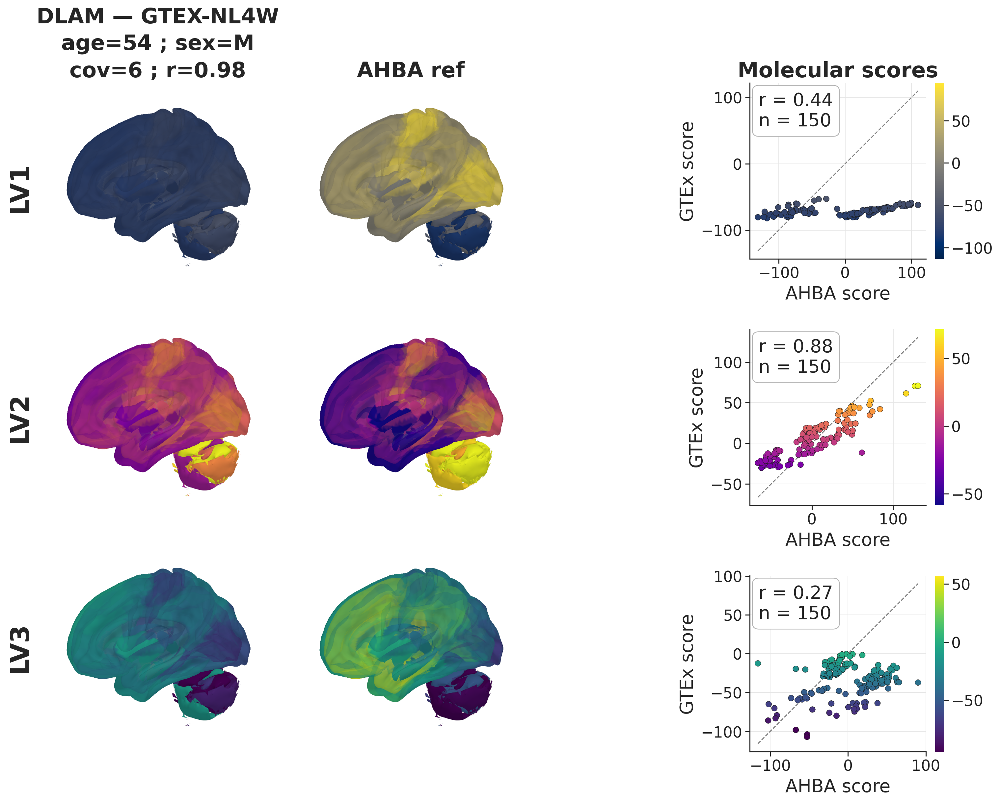

In [6]:
HEMISPHERES   = 'both'             # 'both' full brain | 'left' | 'right'
SAGITTAL_FACE = 'left_lateral'     # 'left_lateral' | 'left_medial' | 'right_lateral' | 'superior'
PLS_CMAP      = 'auto'           # diverging (symmetric) | 'auto' = DLAM per-LV cividis/plasma/viridis
PLS_ZOOM      = 1.0
FONT_SCALE    = 1.5
EXPORT_DIR    = 'out/brain_renders'   # None to skip saving

# GTEx-column header: model + subject + (age; sex; coverage; recon r), pulled from data.
GTEX_HEADER = pg.format_subject_header(prepost, _metrics, SUBJECT, MODEL_NAME,
                                       metric=RECON_METRIC, value=SUBJECT_SCORE)

brain = ob.BrainSurfaceRenderer(atlas_cache='data/brain_atlas_4s')   # loads surface + atlas once
pg.render_pls_gradient_grid(brain, T_gtex, T_ahba, REGIONS, SUBJECT,
                            model_name=MODEL_NAME, gtex_header=GTEX_HEADER, n_lv=N_COMP, cmap=PLS_CMAP,
                            sagittal_face=SAGITTAL_FACE, hemispheres=HEMISPHERES,
                            zoom=PLS_ZOOM, font_scale=FONT_SCALE, export_dir=EXPORT_DIR)

selected GTEX-R55E  (p30 of 318 subjects, pearson_r=0.982)
projected; T_gtex shape (150, 3)
saved out/brain_renders/pls_gradients__dlam__GTEX-R55E.png


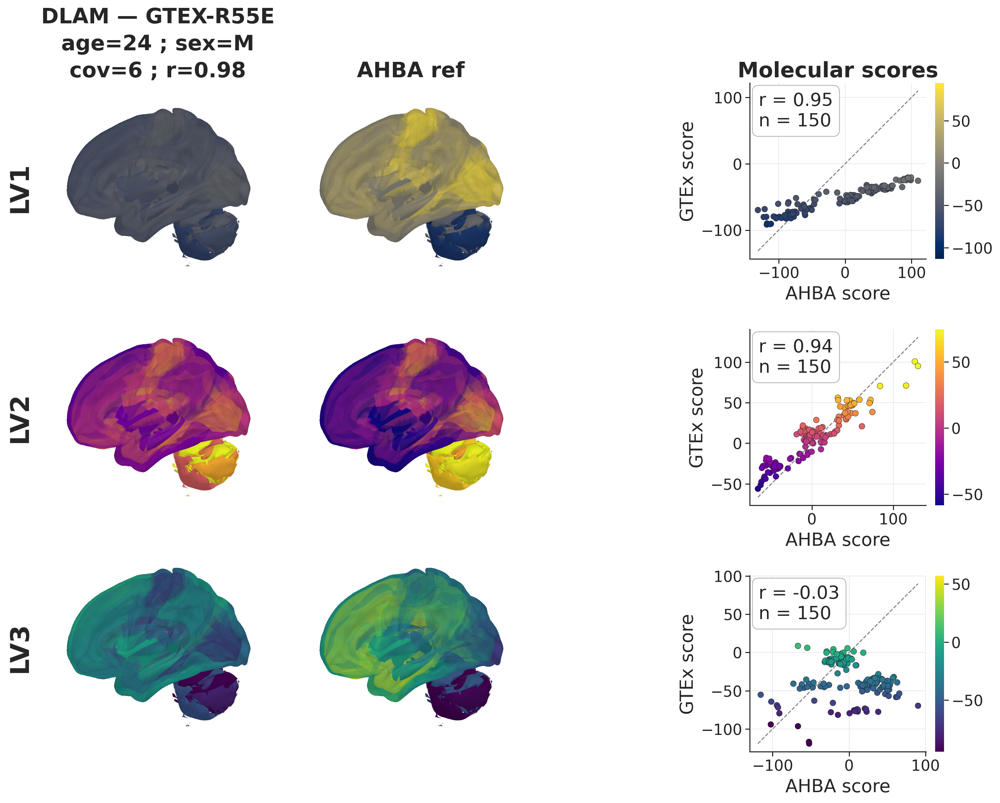

In [7]:
RECON_PERCENTILE = 30.0          # 0..100 over recon quality
RECON_METRIC     = 'pearson_r'   # 'pearson_r' | 'r2' | 'rmse'

SUBJECT, SUBJECT_SCORE, _metrics = pg.select_subject_by_recon_percentile(
    cfg, MODEL_NAME, percentile=RECON_PERCENTILE, metric=RECON_METRIC)
print(f'selected {SUBJECT}  (p{RECON_PERCENTILE:g} of {len(_metrics)} subjects, {RECON_METRIC}={SUBJECT_SCORE:.3f})')

gtex_fused = build_prediction_tensor_view(CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
                                          subjects=[SUBJECT], n_subjects=None, **tier_b)
assert list(gtex_fused.regions) == list(REGIONS), 'subject regions must match the AHBA basis frame'
T_gtex = pg.project_subject(basis, gtex_fused, SUBJECT)
print('projected; T_gtex shape', T_gtex.shape)
HEMISPHERES   = 'both'             # 'both' full brain | 'left' | 'right'
SAGITTAL_FACE = 'left_lateral'     # 'left_lateral' | 'left_medial' | 'right_lateral' | 'superior'
PLS_CMAP      = 'auto'           # diverging (symmetric) | 'auto' = DLAM per-LV cividis/plasma/viridis
PLS_ZOOM      = 1.0
FONT_SCALE    = 1.5
EXPORT_DIR    = 'out/brain_renders'   # None to skip saving

# GTEx-column header: model + subject + (age; sex; coverage; recon r), pulled from data.
GTEX_HEADER = pg.format_subject_header(prepost, _metrics, SUBJECT, MODEL_NAME,
                                       metric=RECON_METRIC, value=SUBJECT_SCORE)

brain = ob.BrainSurfaceRenderer(atlas_cache='data/brain_atlas_4s')   # loads surface + atlas once
pg.render_pls_gradient_grid(brain, T_gtex, T_ahba, REGIONS, SUBJECT,
                            model_name=MODEL_NAME, gtex_header=GTEX_HEADER, n_lv=N_COMP, cmap=PLS_CMAP,
                            sagittal_face=SAGITTAL_FACE, hemispheres=HEMISPHERES,
                            zoom=PLS_ZOOM, font_scale=FONT_SCALE, export_dir=EXPORT_DIR)

selected GTEX-T5JC  (p80 of 318 subjects, pearson_r=0.988)
projected; T_gtex shape (150, 3)
saved out/brain_renders/pls_gradients__dlam__GTEX-T5JC.png


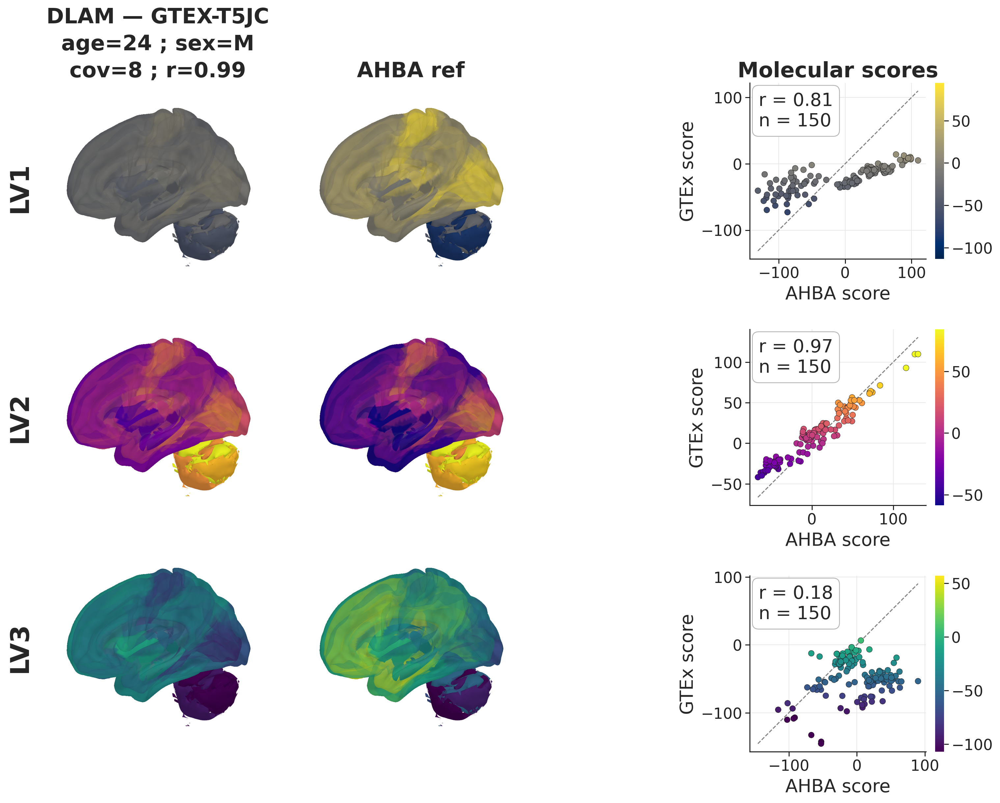

In [8]:
RECON_PERCENTILE = 80.0          # 0..100 over recon quality
RECON_METRIC     = 'pearson_r'   # 'pearson_r' | 'r2' | 'rmse'

SUBJECT, SUBJECT_SCORE, _metrics = pg.select_subject_by_recon_percentile(
    cfg, MODEL_NAME, percentile=RECON_PERCENTILE, metric=RECON_METRIC)
print(f'selected {SUBJECT}  (p{RECON_PERCENTILE:g} of {len(_metrics)} subjects, {RECON_METRIC}={SUBJECT_SCORE:.3f})')

gtex_fused = build_prediction_tensor_view(CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
                                          subjects=[SUBJECT], n_subjects=None, **tier_b)
assert list(gtex_fused.regions) == list(REGIONS), 'subject regions must match the AHBA basis frame'
T_gtex = pg.project_subject(basis, gtex_fused, SUBJECT)
print('projected; T_gtex shape', T_gtex.shape)

HEMISPHERES   = 'both'             # 'both' full brain | 'left' | 'right'
SAGITTAL_FACE = 'left_lateral'     # 'left_lateral' | 'left_medial' | 'right_lateral' | 'superior'
PLS_CMAP      = 'auto'           # diverging (symmetric) | 'auto' = DLAM per-LV cividis/plasma/viridis
PLS_ZOOM      = 1.0
FONT_SCALE    = 1.5
EXPORT_DIR    = 'out/brain_renders'   # None to skip saving

# GTEx-column header: model + subject + (age; sex; coverage; recon r), pulled from data.
GTEX_HEADER = pg.format_subject_header(prepost, _metrics, SUBJECT, MODEL_NAME,
                                       metric=RECON_METRIC, value=SUBJECT_SCORE)

brain = ob.BrainSurfaceRenderer(atlas_cache='data/brain_atlas_4s')   # loads surface + atlas once
pg.render_pls_gradient_grid(brain, T_gtex, T_ahba, REGIONS, SUBJECT,
                            model_name=MODEL_NAME, gtex_header=GTEX_HEADER, n_lv=N_COMP, cmap=PLS_CMAP,
                            sagittal_face=SAGITTAL_FACE, hemispheres=HEMISPHERES,
                            zoom=PLS_ZOOM, font_scale=FONT_SCALE, export_dir=EXPORT_DIR)

## 4 · Many-brain comparison (LV rows x [AHBA ref | N subjects])
*Toggle:* `N_SUBJECTS`, `SELECT_MODE`, `SEED`. Selection axis (subjects ordered left->right along it):
`'percentile'` = even recon-quality intervals (worst->best) · `'age'` = even age intervals across the
observed range, young->old · `'random'` = seeded random. Minimally-labeled, scatter-free extension of
the single-brain grid: diverging `RdBu_r` with per-LV color limits **anchored to the AHBA ref**, so each
subject is read relative to the reference. Figure width scales with `N_SUBJECTS`.

6 subjects (age, pearson_r): GTEX-12WSE=0.97, GTEX-11ZUS=0.98, GTEX-11DXW=0.99, GTEX-1IOXB=0.96, GTEX-17JCI=0.99, GTEX-1PWST=0.99
saved out/brain_renders/pls_gradients_many__dlam__n6.png


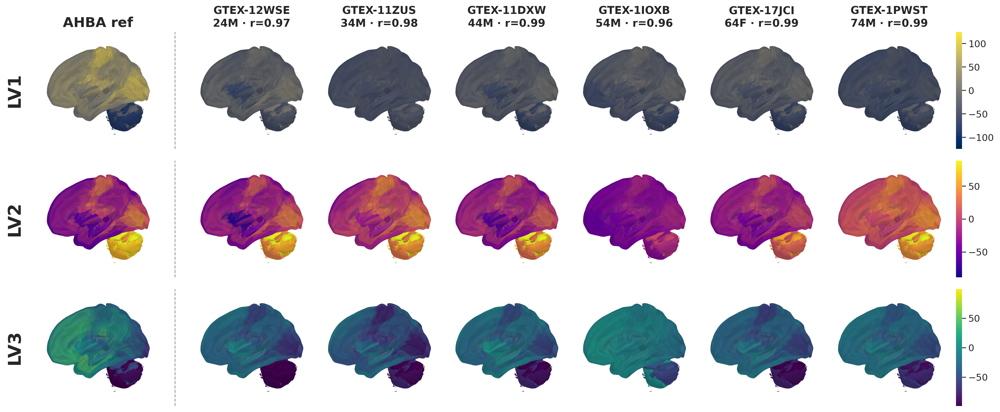

In [9]:
N_SUBJECTS  = 6
SELECT_MODE = 'age'        # 'percentile' (recon intervals) | 'age' (age intervals) | 'random'
SEED        = 0
MANY_CMAP   = 'auto'            # diverging default for the many-brain view
MANY_FACE   = 'left_lateral'
MANY_ZOOM   = 1.0
MANY_FONT   = 1.5
MANY_EXPORT = 'out/brain_renders'  # None to skip saving

SUBJECTS, SUBJECT_SCORES, _m_many = pg.select_subjects_by_recon_percentiles(
    cfg, MODEL_NAME, n=N_SUBJECTS, metric=RECON_METRIC, mode=SELECT_MODE, seed=SEED, prepost=prepost)
print(f'{len(SUBJECTS)} subjects ({SELECT_MODE}, {RECON_METRIC}): '
      + ', '.join(f'{s}={v:.2f}' for s, v in zip(SUBJECTS, SUBJECT_SCORES)))

# project each selected subject's loro_fused onto the frozen AHBA basis
gtex_many = build_prediction_tensor_view(CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
                                         subjects=SUBJECTS, n_subjects=None, **tier_b)
assert list(gtex_many.regions) == list(REGIONS), 'subject regions must match the AHBA basis frame'
SUBJECT_TS  = {s: pg.project_subject(basis, gtex_many, s) for s in SUBJECTS}
SUBJECT_CAPS = {s: pg.format_subject_caption(prepost, _m_many, s, metric=RECON_METRIC, value=v)
                for s, v in zip(SUBJECTS, SUBJECT_SCORES)}

pg.render_pls_gradient_many_brains(brain, T_ahba, SUBJECT_TS, REGIONS,
                                   model_name=MODEL_NAME, subject_captions=SUBJECT_CAPS,
                                   n_lv=N_COMP, cmap=MANY_CMAP, sagittal_face=MANY_FACE,
                                   hemispheres=HEMISPHERES, zoom=MANY_ZOOM, font_scale=MANY_FONT,
                                   export_dir=MANY_EXPORT)

6 subjects (age, pearson_r): GTEX-12WSE=0.97, GTEX-11ZUS=0.98, GTEX-11DXW=0.99, GTEX-1IOXB=0.96, GTEX-17JCI=0.99, GTEX-1PWST=0.99
saved out/brain_renders/pls_gradients_many__dlam__n6.png


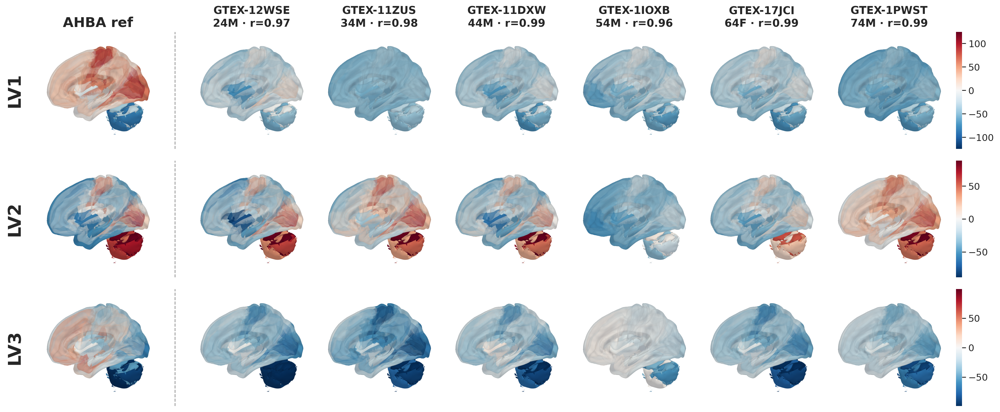

In [10]:
N_SUBJECTS  = 6
SELECT_MODE = 'age'        # 'percentile' (recon intervals) | 'age' (age intervals) | 'random'
SEED        = 0
MANY_CMAP   = 'RdBu_r'            # diverging default for the many-brain view
MANY_FACE   = 'left_lateral'
MANY_ZOOM   = 1.0
MANY_FONT   = 1.5
MANY_EXPORT = 'out/brain_renders'  # None to skip saving

SUBJECTS, SUBJECT_SCORES, _m_many = pg.select_subjects_by_recon_percentiles(
    cfg, MODEL_NAME, n=N_SUBJECTS, metric=RECON_METRIC, mode=SELECT_MODE, seed=SEED, prepost=prepost)
print(f'{len(SUBJECTS)} subjects ({SELECT_MODE}, {RECON_METRIC}): '
      + ', '.join(f'{s}={v:.2f}' for s, v in zip(SUBJECTS, SUBJECT_SCORES)))

# project each selected subject's loro_fused onto the frozen AHBA basis
gtex_many = build_prediction_tensor_view(CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
                                         subjects=SUBJECTS, n_subjects=None, **tier_b)
assert list(gtex_many.regions) == list(REGIONS), 'subject regions must match the AHBA basis frame'
SUBJECT_TS  = {s: pg.project_subject(basis, gtex_many, s) for s in SUBJECTS}
SUBJECT_CAPS = {s: pg.format_subject_caption(prepost, _m_many, s, metric=RECON_METRIC, value=v)
                for s, v in zip(SUBJECTS, SUBJECT_SCORES)}

pg.render_pls_gradient_many_brains(brain, T_ahba, SUBJECT_TS, REGIONS,
                                   model_name=MODEL_NAME, subject_captions=SUBJECT_CAPS,
                                   n_lv=N_COMP, cmap=MANY_CMAP, sagittal_face=MANY_FACE,
                                   hemispheres=HEMISPHERES, zoom=MANY_ZOOM, font_scale=MANY_FONT,
                                   export_dir=MANY_EXPORT)

Random subjects

6 subjects (random, pearson_r): GTEX-XMD1=0.98, GTEX-1GMRU=0.99, GTEX-1B8SG=0.98, GTEX-1F6IF=0.98, GTEX-1HSMO=0.97, GTEX-1R46S=0.99
saved out/brain_renders/pls_gradients_many__dlam__n6.png


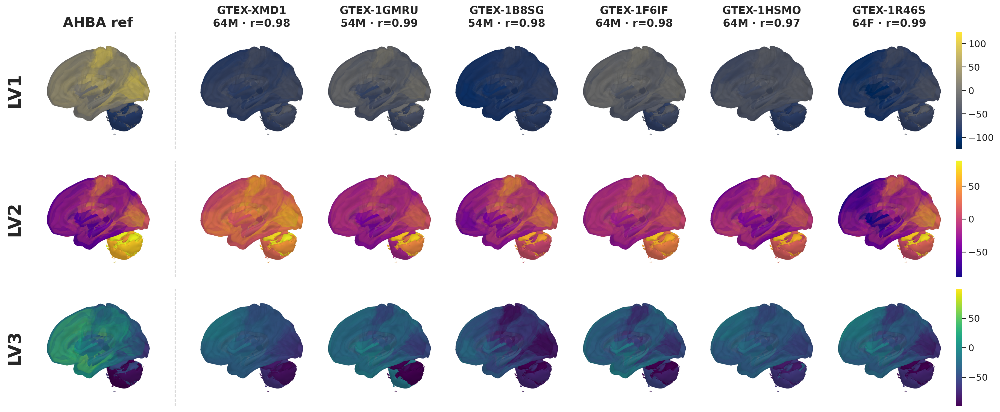

In [11]:
N_SUBJECTS  = 6
SELECT_MODE = 'random'        # 'percentile' (recon intervals) | 'age' (age intervals) | 'random'
SEED        = 0
MANY_CMAP   = 'auto'            # diverging default for the many-brain view
MANY_FACE   = 'left_lateral'
MANY_ZOOM   = 1.0
MANY_FONT   = 1.5
MANY_EXPORT = 'out/brain_renders'  # None to skip saving

SUBJECTS, SUBJECT_SCORES, _m_many = pg.select_subjects_by_recon_percentiles(
    cfg, MODEL_NAME, n=N_SUBJECTS, metric=RECON_METRIC, mode=SELECT_MODE, seed=SEED, prepost=prepost)
print(f'{len(SUBJECTS)} subjects ({SELECT_MODE}, {RECON_METRIC}): '
      + ', '.join(f'{s}={v:.2f}' for s, v in zip(SUBJECTS, SUBJECT_SCORES)))

# project each selected subject's loro_fused onto the frozen AHBA basis
gtex_many = build_prediction_tensor_view(CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
                                         subjects=SUBJECTS, n_subjects=None, **tier_b)
assert list(gtex_many.regions) == list(REGIONS), 'subject regions must match the AHBA basis frame'
SUBJECT_TS  = {s: pg.project_subject(basis, gtex_many, s) for s in SUBJECTS}
SUBJECT_CAPS = {s: pg.format_subject_caption(prepost, _m_many, s, metric=RECON_METRIC, value=v)
                for s, v in zip(SUBJECTS, SUBJECT_SCORES)}

pg.render_pls_gradient_many_brains(brain, T_ahba, SUBJECT_TS, REGIONS,
                                   model_name=MODEL_NAME, subject_captions=SUBJECT_CAPS,
                                   n_lv=N_COMP, cmap=MANY_CMAP, sagittal_face=MANY_FACE,
                                   hemispheres=HEMISPHERES, zoom=MANY_ZOOM, font_scale=MANY_FONT,
                                   export_dir=MANY_EXPORT)

In [ ]:
N_SUBJECTS  = 6
SELECT_MODE = 'random'        # 'percentile' (recon intervals) | 'age' (age intervals) | 'random'
SEED        = 0
MANY_CMAP   = 'RdBu_r'            # diverging default for the many-brain view
MANY_FACE   = 'left_lateral'
MANY_ZOOM   = 1.0
MANY_FONT   = 1.5
MANY_EXPORT = 'out/brain_renders'  # None to skip saving

SUBJECTS, SUBJECT_SCORES, _m_many = pg.select_subjects_by_recon_percentiles(
    cfg, MODEL_NAME, n=N_SUBJECTS, metric=RECON_METRIC, mode=SELECT_MODE, seed=SEED, prepost=prepost)
print(f'{len(SUBJECTS)} subjects ({SELECT_MODE}, {RECON_METRIC}): '
      + ', '.join(f'{s}={v:.2f}' for s, v in zip(SUBJECTS, SUBJECT_SCORES)))

# project each selected subject's loro_fused onto the frozen AHBA basis
gtex_many = build_prediction_tensor_view(CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
                                         subjects=SUBJECTS, n_subjects=None, **tier_b)
assert list(gtex_many.regions) == list(REGIONS), 'subject regions must match the AHBA basis frame'
SUBJECT_TS  = {s: pg.project_subject(basis, gtex_many, s) for s in SUBJECTS}
SUBJECT_CAPS = {s: pg.format_subject_caption(prepost, _m_many, s, metric=RECON_METRIC, value=v)
                for s, v in zip(SUBJECTS, SUBJECT_SCORES)}

pg.render_pls_gradient_many_brains(brain, T_ahba, SUBJECT_TS, REGIONS,
                                   model_name=MODEL_NAME, subject_captions=SUBJECT_CAPS,
                                   n_lv=N_COMP, cmap=MANY_CMAP, sagittal_face=MANY_FACE,
                                   hemispheres=HEMISPHERES, zoom=MANY_ZOOM, font_scale=MANY_FONT,
                                   export_dir=MANY_EXPORT)

6 subjects (random, pearson_r): GTEX-XMD1=0.98, GTEX-1GMRU=0.99, GTEX-1B8SG=0.98, GTEX-1F6IF=0.98, GTEX-1HSMO=0.97, GTEX-1R46S=0.99
